### Importing the libraries

In [36]:
import pandas as pd
import numpy as np
import concurrent.futures
import torch
import cv2
import random
import ast
import sys
import requests
import matplotlib.pyplot as plt
from PIL import ImageFile, Image
from io import BytesIO
from sklearn.cluster import KMeans
ImageFile.LOAD_TRUNCATED_IMAGES = True

### Creating the dataframe

In [37]:
data1 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_bags.csv')
data2 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_tops.csv')
data3 = pd.read_csv(
    '/media/hdd2/navaneeth/Deep-Learning-Projects/pytorch/color/color_pants.csv')

In [38]:
data = pd.concat([data1, data2, data3], ignore_index=True)
data = data[data['Category'].isin(['Bags', 'Pants', 'Tops'])]
data['Category_bbox'] = data['Category_bbox'].apply(
    lambda x: ast.literal_eval(x))

### Downloading the images from URL and saving

In [39]:
""" def download_image(url, file_name):
    r = requests.get(url, stream=True)
    if r.status_code == 200:
        print('Downloading ' + file_name)
        r.raw.decode_content = True
        with open(file_name, 'wb') as f:
            f.write(r.content)
        return file_name
    else:
        return None

with concurrent.futures.ThreadPoolExecutor() as executor:
    for i, row in data.iterrows():
        file_name = 'images/' + str(i) + '.jpg'
        url = row['image_url']
        executor.submit(download_image, url, file_name) """

" def download_image(url, file_name):\n    r = requests.get(url, stream=True)\n    if r.status_code == 200:\n        print('Downloading ' + file_name)\n        r.raw.decode_content = True\n        with open(file_name, 'wb') as f:\n            f.write(r.content)\n        return file_name\n    else:\n        return None\n\nwith concurrent.futures.ThreadPoolExecutor() as executor:\n    for i, row in data.iterrows():\n        file_name = 'images/' + str(i) + '.jpg'\n        url = row['image_url']\n        executor.submit(download_image, url, file_name) "

### Removing Unnecessary data from each dataset

In [40]:
""" data.drop(['image_url'], axis=1, inplace=True)
data.drop(['Category'], axis=1, inplace=True) """

" data.drop(['image_url'], axis=1, inplace=True)\ndata.drop(['Category'], axis=1, inplace=True) "

### Adding image data to the dataframes

In [41]:
def preprocess_image(file):
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


def preprocess_image_crop(file, labels_crops):
    img = cv2.imread(file)
    x1, y1, x2, y2 = int(labels_crops[0]), int(
        labels_crops[1]), int(labels_crops[2]), int(labels_crops[3])
    img = img[y1:y2, x1:x2]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


with concurrent.futures.ThreadPoolExecutor() as executor:
    for i, row in data.iterrows():
        file_name = 'images/' + str(i) + '.jpg'
        labels_crops = row['Category_bbox']
        data.at[i, 'image_data'] = executor.submit(
            preprocess_image, file_name)
        data.at[i, 'image_data_crop'] = executor.submit(
            preprocess_image_crop, file_name, labels_crops)

data['image_data'] = data['image_data'].apply(lambda x: x.result())
data['image_data_crop'] = data['image_data_crop'].apply(lambda x: x.result())

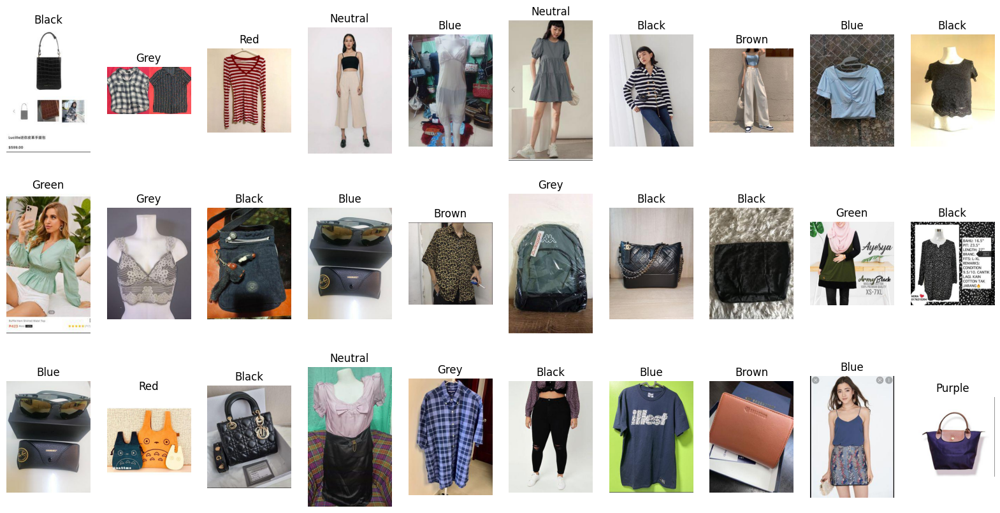

In [42]:
random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['image_data']
    img2 = data.iloc[y]['image_data']
    img3 = data.iloc[z]['image_data']
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show()

### Plotting sample images of each dataset

### Image Processing 

#### Removing all unnecessary colors other than the Color HEX given in data

In [43]:
""" def remove_background(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(img, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(
        thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = img[y:y+h, x:x+w]
    return crop

def patch(image):
    image1=image.reshape((image.shape[0]*image.shape[1],3))
    kmeans = KMeans(n_clusters=10, random_state=20, n_init=10).fit(image1)
    labels=kmeans.labels_
    counts=np.bincount(labels)
    colors=kmeans.cluster_centers_
    #plt.pie(counts,colors=colors/255,autopct='%1.1f%%')
    #plt.show()
    sorted_indices = np.argsort(counts)[::-1]
    sorted_colors = colors[sorted_indices]
    majority_color = sorted_colors[0]
    patch = np.zeros(shape=image.shape, dtype=np.uint8)
    patch[:,:,:]=majority_color
    return patch

image,label=data.iloc[571]['image_data_crop'],data.iloc[571]['Base Color']
plt.imshow(image)
plt.axis('off')
plt.show()
patch_color=patch(image)
plt.imshow(patch_color/255)
plt.axis('off')
plt.show() """

" def remove_background(img):\n    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)\n    _, thresh = cv2.threshold(img, 1, 255, cv2.THRESH_BINARY)\n    contours, _ = cv2.findContours(\n        thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)\n    cnt = contours[0]\n    x, y, w, h = cv2.boundingRect(cnt)\n    crop = img[y:y+h, x:x+w]\n    return crop\n\ndef patch(image):\n    image1=image.reshape((image.shape[0]*image.shape[1],3))\n    kmeans = KMeans(n_clusters=10, random_state=20, n_init=10).fit(image1)\n    labels=kmeans.labels_\n    counts=np.bincount(labels)\n    colors=kmeans.cluster_centers_\n    #plt.pie(counts,colors=colors/255,autopct='%1.1f%%')\n    #plt.show()\n    sorted_indices = np.argsort(counts)[::-1]\n    sorted_colors = colors[sorted_indices]\n    majority_color = sorted_colors[0]\n    patch = np.zeros(shape=image.shape, dtype=np.uint8)\n    patch[:,:,:]=majority_color\n    return patch\n\nimage,label=data.iloc[571]['image_data_crop'],data.iloc[571]['Base Color']\nplt.i

In [44]:
""" with concurrent.futures.ThreadPoolExecutor(32) as executor:
    for i, row in data.iterrows():
        image = row['image_data_crop']
        patch_color=patch(image)
        data.at[i, 'patch'] = patch_color """

" with concurrent.futures.ThreadPoolExecutor(32) as executor:\n    for i, row in data.iterrows():\n        image = row['image_data_crop']\n        patch_color=patch(image)\n        data.at[i, 'patch'] = patch_color "

### Plotting the processed images

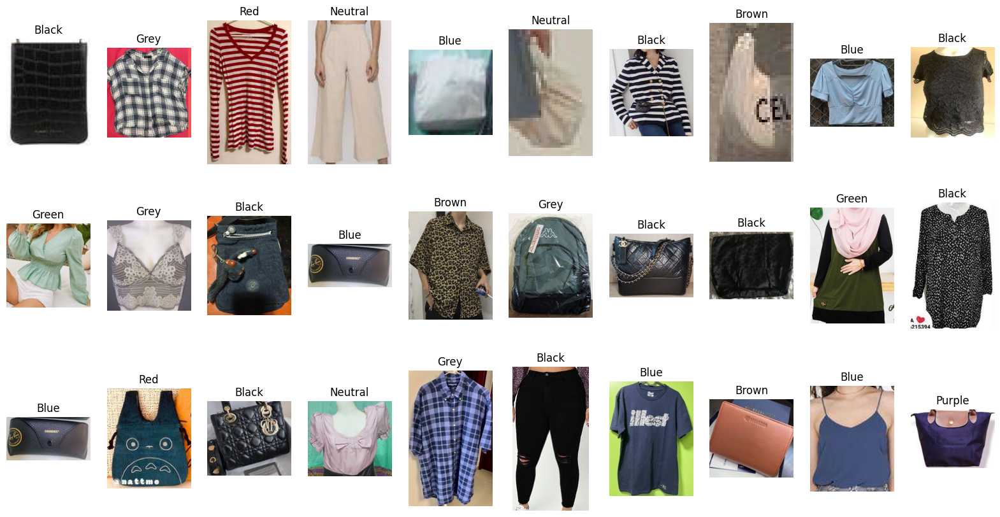

In [45]:
random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['image_data_crop']
    img2 = data.iloc[y]['image_data_crop']
    img3 = data.iloc[z]['image_data_crop']
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show()

In [46]:
""" random.seed(31)
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i in range(10):
    x = random.randint(0, len(data))
    y = random.randint(0, len(data))
    z = random.randint(0, len(data))
    img1 = data.iloc[x]['patch']
    img2 = data.iloc[y]['patch']
    img3 = data.iloc[z]['patch']
    ax[0, i].imshow(img1)
    ax[0, i].set_title(data.iloc[x]['Base Color'])
    ax[1, i].imshow(img2)
    ax[1, i].set_title(data.iloc[y]['Base Color'])
    ax[2, i].imshow(img3)
    ax[2, i].set_title(data.iloc[z]['Base Color'])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
plt.show() """

" random.seed(31)\nfig, ax = plt.subplots(3, 10, figsize=(20, 10))\nfor i in range(10):\n    x = random.randint(0, len(data))\n    y = random.randint(0, len(data))\n    z = random.randint(0, len(data))\n    img1 = data.iloc[x]['patch']\n    img2 = data.iloc[y]['patch']\n    img3 = data.iloc[z]['patch']\n    ax[0, i].imshow(img1)\n    ax[0, i].set_title(data.iloc[x]['Base Color'])\n    ax[1, i].imshow(img2)\n    ax[1, i].set_title(data.iloc[y]['Base Color'])\n    ax[2, i].imshow(img3)\n    ax[2, i].set_title(data.iloc[z]['Base Color'])\n    ax[0, i].axis('off')\n    ax[1, i].axis('off')\n    ax[2, i].axis('off')\nplt.show() "

### Splitting the dataset into train,validation and testsets (70%-15%-15%)

In [71]:
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(data, test_size=0.3, random_state=31)
val_data, test_data = train_test_split(
    temp_data, test_size=0.5, random_state=1)

test_data = pd.read_pickle('test_data.pkl')

""" test_data['index'] = range(len(test_data))
train_data['index'] = range(len(train_data))
val_data['index'] = range(len(val_data))
 """
print(train_data.shape)
print(val_data.shape)
print(test_data.shape)

(2844, 7)
(609, 7)
(610, 8)


In [48]:
""" import matplotlib.pyplot as plt
from ipywidgets import interact, widgets
from IPython.display import display, clear_output
import pandas as pd

base_colors = ["Red", "Blue", "Green", "Yellow", "Purple", "Orange", "Pink", "Neutral", "White", "Black", "Grey", "Brown"]


current_index = 0
output_image = widgets.Output()
base_color_dropdown = widgets.Dropdown(options=base_colors, description="Base Color:")
base_color_dropdown.value = test_data['Base Color'].iloc[current_index]
status_text = widgets.HTML(value="")

def display_image(index):
    plt.figure(figsize=(4, 4))
    image = test_data['image_data_crop'].iloc[index]
    color = test_data['Base Color'].iloc[index]
    image=Image.fromarray(image)
    image=transform(image)
    model.to('cpu')
    model.eval()
    output=model(image.unsqueeze(0))
    _, predicted = torch.max(output.data, 1)
    label = list(color_dict.keys())[list(color_dict.values()).index(predicted.item())]
    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')
    plt.title(test_data['Base Color'].iloc[index]+"\n"+label)
    
    with output_image:
        clear_output(wait=True)
        display(plt.gcf())

display_image(current_index)
status_text.value = f"Image {wrong_index[current_index]} of {len(test_data)}"

def next_button_clicked(_):
    global current_index
    current_index = (current_index + 1) % len(wrong_index)
    display_image(wrong_index[current_index])
    status_text.value = f"Image {wrong_index[current_index] + 1} of {len(test_data)}"
    base_color_dropdown.value = test_data['Base Color'].iloc[wrong_index[current_index]]

def previous_button_clicked(_):
    global current_index
    current_index = (current_index - 1) % len(wrong_index)
    display_image(wrong_index[current_index])
    status_text.value = f"Image {wrong_index[current_index] - 1} of {len(test_data)}"
    base_color_dropdown.value = test_data['Base Color'].iloc[wrong_index[current_index]]

def base_color_dropdown_change(change):
    selected_color = str(change.new)
    test_data['Base Color'] = test_data['Base Color'].astype(str)
    test_data.iloc[wrong_index[current_index], test_data.columns.get_loc('Base Color')] = selected_color
    display_image(wrong_index[current_index])

previous_button = widgets.Button(description="Previous")
previous_button.on_click(previous_button_clicked)
next_button = widgets.Button(description="Next")
next_button.on_click(next_button_clicked)

base_color_dropdown.observe(base_color_dropdown_change, names='value')

display(status_text)
display(output_image)
display(base_color_dropdown)
display(previous_button)
display(next_button)
 """

' import matplotlib.pyplot as plt\nfrom ipywidgets import interact, widgets\nfrom IPython.display import display, clear_output\nimport pandas as pd\n\nbase_colors = ["Red", "Blue", "Green", "Yellow", "Purple", "Orange", "Pink", "Neutral", "White", "Black", "Grey", "Brown"]\n\n\ncurrent_index = 0\noutput_image = widgets.Output()\nbase_color_dropdown = widgets.Dropdown(options=base_colors, description="Base Color:")\nbase_color_dropdown.value = test_data[\'Base Color\'].iloc[current_index]\nstatus_text = widgets.HTML(value="")\n\ndef display_image(index):\n    plt.figure(figsize=(4, 4))\n    image = test_data[\'image_data_crop\'].iloc[index]\n    color = test_data[\'Base Color\'].iloc[index]\n    image=Image.fromarray(image)\n    image=transform(image)\n    model.to(\'cpu\')\n    model.eval()\n    output=model(image.unsqueeze(0))\n    _, predicted = torch.max(output.data, 1)\n    label = list(color_dict.keys())[list(color_dict.values()).index(predicted.item())]\n    plt.imshow(image.perm

In [49]:
#test_data.to_pickle('test_data.pkl')

### Upsampling miniority classes to match with the majority class

In [50]:
from sklearn.utils import resample

n = max(train_data['Base Color'].value_counts())

desired_sample_sizes = {
    'Black': 627,
    'Grey': 700,
    'White': 1500,
    'Blue': 627,
    'Red': 627,
    'Green': 800,
    'Brown': 700,
    'Yellow': 627,
    'Pink': 827,
    'Purple': 2000,
    'Orange': 700,
    'Neutral': 827,
}

train_data_resampled = pd.DataFrame(columns=train_data.columns)
for color in desired_sample_sizes.keys():
    df = train_data[train_data['Base Color'] == color]
    df_resampled = resample(df, replace=True,
                            n_samples=desired_sample_sizes[color], random_state=1)
    train_data_resampled = pd.concat(
        [train_data_resampled, df_resampled], ignore_index=True)
    
print(train_data_resampled['Base Color'].value_counts())

Base Color
Purple     2000
White      1500
Pink        827
Neutral     827
Green       800
Grey        700
Brown       700
Orange      700
Black       627
Blue        627
Red         627
Yellow      627
Name: count, dtype: int64


In [51]:
color_dict = {}
for i, c in enumerate(set(data['Base Color'].unique())):
    color_dict[c] = i
print(color_dict)

{'Blue': 0, 'Green': 1, 'Black': 2, 'Pink': 3, 'Grey': 4, 'Yellow': 5, 'Purple': 6, 'Orange': 7, 'Neutral': 8, 'White': 9, 'Red': 10, 'Brown': 11}


### The Color Dataset

In [52]:
from torch.utils.data import Dataset, DataLoader

""" def normalize_color(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image[0,:,:] = cv2.equalizeHist(image[0,:,:])
    image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    return image

def remove(img):
    gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    contours = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[0]
    max_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, [max_contour], 0, 255, -1)
    result = img.copy()
    result[mask==0] = (255,255,255)
    return result """


class ColorDataset(Dataset):
    def __init__(self, data, colors, transform=None):
        self.data = data
        self.transform = transform
        self.color2idx = colors

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img = self.data.iloc[idx]['image_data_crop']
        img=Image.fromarray(img)
        img = self.transform(img)
        label = self.data.iloc[idx]['Base Color']
        label = self.color2idx[label]
        return img, label

### Creating the dataloaders

In [53]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train_dataset = ColorDataset(train_data,color_dict, transform=transform)
valid_dataset = ColorDataset(val_data,color_dict, transform=transform)
test_dataset = ColorDataset(test_data,color_dict, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=3)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=3)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=3)

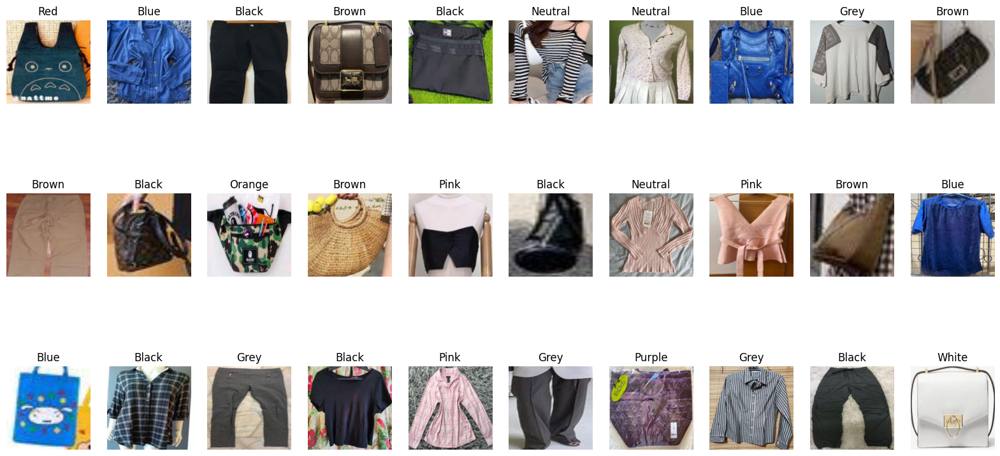

In [54]:
fig, ax = plt.subplots(3, 10, figsize=(20, 10))
for i, (img,label) in enumerate(train_loader):
    if i >= 3:
        break
    for j in range(10):
        ax[i, j].imshow(img[j].permute(1, 2, 0))
        ax[i, j].set_title(list(color_dict.keys())[list(
            color_dict.values()).index(label[j].item())])
        ax[i, j].axis('off')
plt.show()


### Model Creation , Loss Function and Optimizers

#### Base CNN

In [55]:
""" import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau


class ColorClassifier(nn.Module):
    def __init__(self):
        super(ColorClassifier, self).__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1), # (256 - 4 + 2 * 1) / 2 + 1 = 128
            nn.MaxPool2d(kernel_size=4, stride=4), # (128 - 4) / 4 + 1 = 32
            nn.BatchNorm2d(64),
            nn.ReLU(),
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 256, kernel_size=2, stride=2, padding=1), # (32 - 2 + 2 * 1) / 2 + 1 = 17
            nn.MaxPool2d(kernel_size=3, stride=3), # (17 - 3) / 3 + 1 = 5
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=2, stride=1, padding=1), # (5 - 2 + 2 * 1) / 1 + 1 = 6
            nn.MaxPool2d(kernel_size=3, stride=1), # (6 - 3) / 1 + 1 = 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )
        
        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 512, kernel_size=2, stride=1, padding=1), # (4 - 2 + 2 * 1) / 1 + 1 = 5
            nn.MaxPool2d(kernel_size=2, stride=1), # (5 - 2) / 1 + 1 = 4
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Dropout(0.2),
        )
        
        self.fc1 = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512 * 4 * 4, 512),
            nn.ReLU(),
        )
        
        self.fc2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        self.fc3 = nn.Sequential(
            nn.Linear(256, 12),
        )

        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x


model1 = ColorClassifier()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True) """

" import torch.nn as nn\nimport torch.optim as optim\nfrom torch.optim.lr_scheduler import ReduceLROnPlateau\n\n\nclass ColorClassifier(nn.Module):\n    def __init__(self):\n        super(ColorClassifier, self).__init__()\n        \n        self.conv1 = nn.Sequential(\n            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1), # (256 - 4 + 2 * 1) / 2 + 1 = 128\n            nn.MaxPool2d(kernel_size=4, stride=4), # (128 - 4) / 4 + 1 = 32\n            nn.BatchNorm2d(64),\n            nn.ReLU(),\n        )\n        \n        self.conv2 = nn.Sequential(\n            nn.Conv2d(64, 256, kernel_size=2, stride=2, padding=1), # (32 - 2 + 2 * 1) / 2 + 1 = 17\n            nn.MaxPool2d(kernel_size=3, stride=3), # (17 - 3) / 3 + 1 = 5\n            nn.BatchNorm2d(256),\n            nn.ReLU(),\n        )\n\n        self.conv3 = nn.Sequential(\n            nn.Conv2d(256, 128, kernel_size=2, stride=1, padding=1), # (5 - 2 + 2 * 1) / 1 + 1 = 6\n            nn.MaxPool2d(kernel_size=3, stride=1), # 

#### Resnet

In [56]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, num_skip_connections=4):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.skip_connections = nn.ModuleList([nn.Sequential() for _ in range(num_skip_connections)])
        for i in range(num_skip_connections):
            if stride != 1 or in_channels != out_channels:
                self.skip_connections[i] = nn.Sequential(
                    nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                    nn.BatchNorm2d(out_channels)
                )
        
    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)

        for skip_connection in self.skip_connections:
            out += skip_connection(residual)

        out = self.relu(out)
        return out

class ResNet(nn.Module):
    def __init__(self, block, layers, num_classes=12):
        super(ResNet, self).__init__()
        self.in_channels = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self.make_layer(block, 64, layers[0])
        self.layer2 = self.make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self.make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self.make_layer(block, 512, layers[3], stride=2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)
        
    def make_layer(self, block, out_channels, blocks, stride=1):
        layers = []
        layers.append(block(self.in_channels, out_channels, stride))
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(block(out_channels, out_channels))
        return nn.Sequential(*layers)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        
        return x

model = ResNet(ResidualBlock, [2,2,2,2], num_classes=12)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True)


In [57]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
criterion.to(device)

CrossEntropyLoss()

In [58]:
from torchsummary import summary
summary(model, (3, 256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
    ResidualBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

### Prediction for a single image by Untrained model

In [59]:
images ,labels = next(iter(test_loader))
images,labels = images.to(device), labels.to(device)
output = model(images)
print(output[0])
_, preds = torch.max(output, 1)
print("Actual:", labels[0])
print("Predicted:", preds[0])

tensor([ 3.2292, -3.8409, -5.0748,  4.5572, -1.1798, -3.2999, -0.0264, -3.9967,
        -1.9235, -2.4591, -2.5086, -0.2138], device='cuda:0',
       grad_fn=<SelectBackward0>)
Actual: tensor(8, device='cuda:0')
Predicted: tensor(3, device='cuda:0')


In [60]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

### Training Loop

In [61]:
import mlflow
epochs = 32
valid_loss_min = np.Inf
train_losses = []
valid_losses = []
train_accs = []
valid_accs = []
mlflow.set_experiment("Color_Classifier_crops")
with mlflow.start_run() as run:
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("Learning Rate", 0.001)
    mlflow.log_param("scheduler", "ReduceLROnPlateau")
    mlflow.log_param("Optimizer", "Adam")
    mlflow.log_param("Loss Function", "CrossEntropyLoss")
    mlflow.log_param("Batch Size", 64)
    mlflow.log_param("Activation", "ReLU")
    for epoch in range(epochs):
        train_loss = 0
        valid_loss = 0
        train_acc = 0
        valid_acc = 0
        model.train()
        for images,labels in train_loader:
            images,labels = images.to(device),labels.to(device)
            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()*images.size(0)
            _, preds = torch.max(output, 1)
            train_acc += torch.sum(preds == labels.data)
        model.eval()
        for images,labels in valid_loader:
            images,labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            valid_loss += loss.item()*images.size(0)
            _, preds = torch.max(output, 1)
            valid_acc += torch.sum(preds == labels.data)
        train_loss = train_loss/len(train_loader.dataset)
        valid_loss = valid_loss/len(valid_loader.dataset)
        train_acc = train_acc/len(train_loader.dataset)*100
        valid_acc = valid_acc/len(valid_loader.dataset)*100
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accs.append(train_acc.item())
        valid_accs.append(valid_acc.item())
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Accuracy: {:.6f}'.format(
            epoch+1, train_loss, valid_loss, train_acc, valid_acc))
        mlflow.log_metric("train_loss", train_loss)
        mlflow.log_metric("valid_loss", valid_loss)
        mlflow.log_metric("train_acc", train_acc)
        mlflow.log_metric("valid_acc", valid_acc)
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/valid', valid_loss, epoch)
        writer.add_scalar('Accuracy/train', train_acc, epoch)
        writer.add_scalar('Accuracy/valid', valid_acc, epoch)
        if valid_loss < valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}). Saving model...'.format(
                valid_loss_min, valid_loss))
            torch.save(model.state_dict(), 'model1.pt')
            valid_loss_min = valid_loss
        scheduler.step(valid_loss)
    mlflow.pytorch.log_model(model, "model1")
    writer.add_graph(model, images)
    current_run_id = mlflow.active_run().info.run_id

Epoch: 1 	Training Loss: 2.233339 	Validation Loss: 1.424761 	Training Accuracy: 53.059071 	Validation Accuracy: 56.650246
Validation loss decreased (inf --> 1.424761). Saving model...
Epoch: 2 	Training Loss: 1.141716 	Validation Loss: 1.206778 	Training Accuracy: 63.994373 	Validation Accuracy: 64.532021
Validation loss decreased (1.424761 --> 1.206778). Saving model...
Epoch: 3 	Training Loss: 1.057377 	Validation Loss: 1.046113 	Training Accuracy: 63.853729 	Validation Accuracy: 65.188835
Validation loss decreased (1.206778 --> 1.046113). Saving model...
Epoch: 4 	Training Loss: 1.011392 	Validation Loss: 2.799647 	Training Accuracy: 66.174400 	Validation Accuracy: 46.798031
Epoch: 5 	Training Loss: 0.974482 	Validation Loss: 1.521928 	Training Accuracy: 67.721519 	Validation Accuracy: 50.738918
Epoch: 6 	Training Loss: 0.929254 	Validation Loss: 1.329245 	Training Accuracy: 68.530235 	Validation Accuracy: 57.142860
Epoch: 7 	Training Loss: 0.923899 	Validation Loss: 1.116556 	Trai

2023/11/01 01:19:37 WARNING mlflow.utils.requirements_utils: Found torch version (2.0.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.0.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


Epoch: 32 	Training Loss: 0.608368 	Validation Loss: 0.828459 	Training Accuracy: 77.707451 	Validation Accuracy: 73.727425


2023/11/01 01:19:40 WARNING mlflow.utils.requirements_utils: Found torch version (2.0.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.0.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


### Test Accuracy

In [72]:
with mlflow.start_run(run_id=current_run_id):
    model.eval()
    wrong=0
    test_acc = 0
    for images,labels in test_loader:
        images,labels = images.to(device), labels.to(device)
        output = model(images)
        _, preds = torch.max(output, 1)
        test_acc += torch.sum(preds == labels.data)
        wrong += torch.sum(preds != labels.data)
    test_acc = test_acc/len(test_loader.dataset)*100
    mlflow.log_metric("test_acc", test_acc)
    print("Test Accuracy: {:.6f}".format(test_acc))
    print("Wrong Predictions: ", wrong.item())
    print("Total Predictions: ", len(test_loader.dataset))

Test Accuracy: 86.557373
Wrong Predictions:  82
Total Predictions:  610


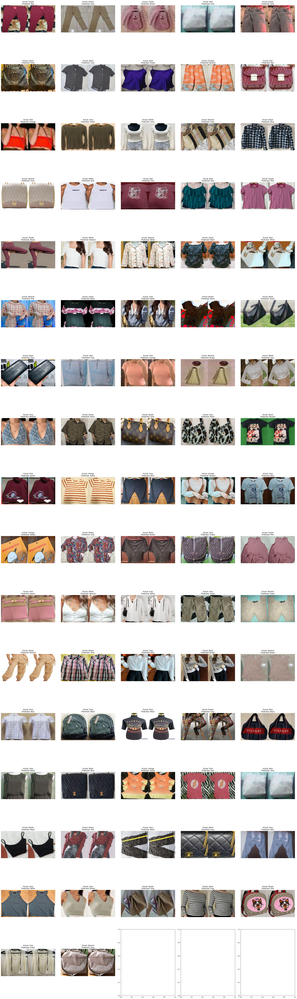

In [63]:
model.eval()
wrong_images = []
wrong_labels = []

for images,labels in test_loader:
    images,labels = images.to(device), labels.to(device)
    output = model(images)
    _, preds = torch.max(output, 1)
    for j in range(len(labels)):
        if preds[j] != labels[j]:
            grid = torch.cat((images[j], images[j]), dim=2)
            wrong_images.append(grid)
            wrong_labels.append((labels[j].item(), preds[j].item()))


num_wrong_images = len(wrong_images)
num_cols = 5 
num_rows = (num_wrong_images + num_cols - 1) // num_cols
fig, ax = plt.subplots(num_rows, num_cols, figsize=(6 * num_cols, 6 * num_rows))
for i, (image, (actual_label, predicted_label)) in enumerate(zip(wrong_images, wrong_labels)):
    row, col = divmod(i, num_cols)
    ax[row, col].imshow(image.cpu().permute(1, 2, 0))
    ax[row, col].set_title("Actual: {}\nPredicted: {}".format(
        list(color_dict.keys())[list(color_dict.values()).index(actual_label)],
        list(color_dict.keys())[list(color_dict.values()).index(predicted_label)]))
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()

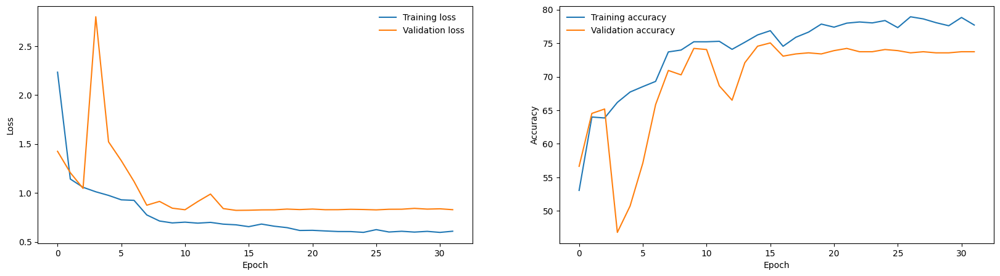

In [64]:
fig = plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(frameon=False)
plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Training accuracy')
plt.plot(valid_accs, label='Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(frameon=False)
plt.show()

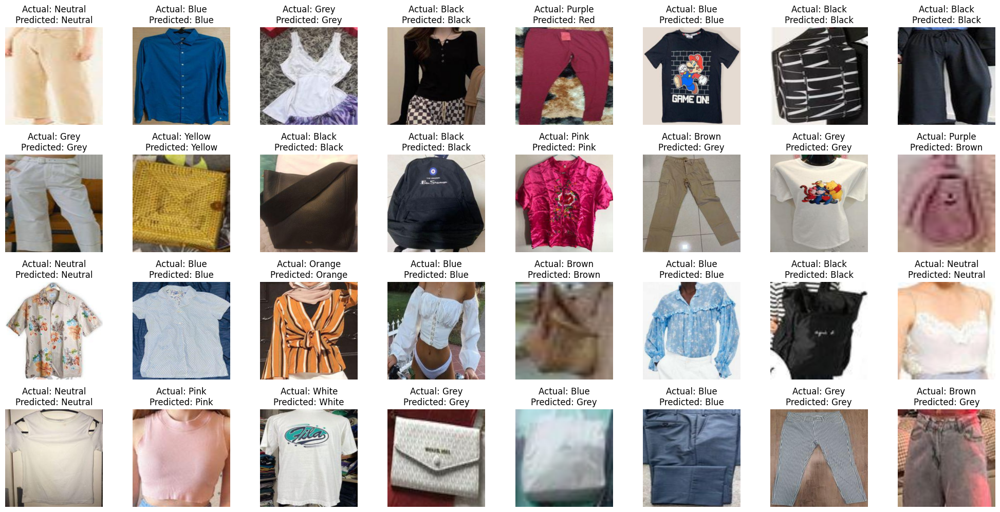

In [65]:
images,labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
output = model(images)
_, preds = torch.max(output, 1)
fig = plt.figure(figsize=(20, 20))
for i in range(32):
    ax = plt.subplot(8, 8, i+1)
    ax.imshow(images[i].permute(1, 2, 0).cpu())
    ax.set_title("Actual: {}\nPredicted: {}".format(
        list(color_dict.keys())[
            list(color_dict.values()).index(labels[i].item())],
        list(color_dict.keys())[
            list(color_dict.values()).index(preds[i].item())]
    ))
    ax.axis('off')
plt.tight_layout()
plt.show()

In [66]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

model.to(device)
model.eval()
y_pred = []
y_true = []
for images,labels in test_loader:
    images,labels = images.to(device), labels.to(device)
    output = model(images)
    _, preds = torch.max(output, 1)
    y_pred.extend(preds.tolist())
    y_true.extend(labels.tolist())
print("F1 Score: {:.6f}".format(f1_score(y_true, y_pred, average='weighted')))
print("Precision: {:.6f}".format(
    precision_score(y_true, y_pred, average='weighted')))
print("Recall: {:.6f}".format(recall_score(
    y_true, y_pred, average='weighted')))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))

F1 Score: 0.864835
Precision: 0.866501
Recall: 0.865574
Confusion Matrix:
[[ 75   0   1   0   3   0   1   0   0   1   1   0]
 [  0  33   2   0   1   0   0   0   0   0   0   0]
 [  2   1 145   0   4   0   0   0   1   0   0   2]
 [  0   0   0  17   0   0   0   1   0   0   2   2]
 [  5   3   6   0 100   0   1   0   1   2   0   1]
 [  0   0   0   0   0   2   0   0   0   0   0   0]
 [  0   0   0   2   0   0  11   0   0   0   1   2]
 [  0   0   0   0   0   3   0   3   2   0   0   0]
 [  0   1   0   1   3   0   0   0  40   1   0   2]
 [  1   0   0   0   2   0   0   0   2  17   0   0]
 [  0   0   0   1   0   0   0   1   0   0  21   0]
 [  0   0   3   2   7   0   0   0   1   0   0  64]]


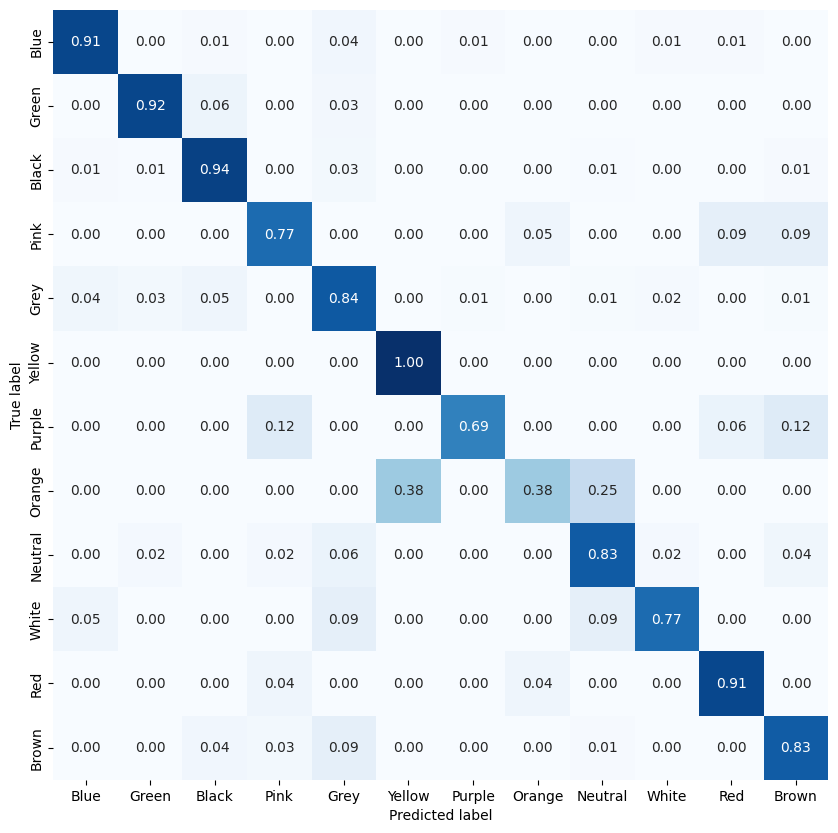

In [67]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cm, index=list(color_dict.keys()),
                     columns=list(color_dict.keys()))
plt.figure(figsize=(10, 10))
sns.heatmap(df_cm, annot=True, cmap='Blues', fmt='.2f', cbar=False)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [68]:
writer.close()

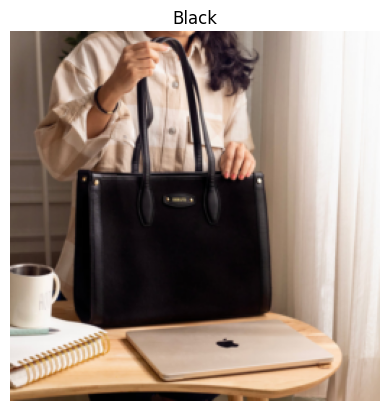

In [69]:
model.to(device)
model.eval()
url='https://www.themessycorner.in/cdn/shop/products/07_800x.jpg?v=1680598271'
r=requests.get(url)
image1=Image.open(BytesIO(r.content))
image=transform(image1)
image=image.unsqueeze(0)
image=image.to(device)
output=model(image)
_,preds=torch.max(output,1)
plt.imshow(image.cpu().squeeze().permute(1,2,0))
plt.title(list(color_dict.keys())[list(color_dict.values()).index(preds.item())])
plt.axis('off')
plt.show()

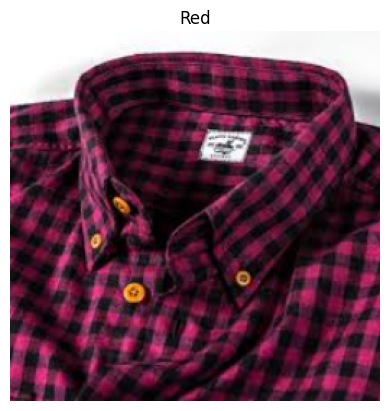

In [70]:
model.to(device)
model.eval()
url='https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSmPXDcEnm1fwxtf54vfb6vIIMDYouM52AUQA&usqp=CAU'
r=requests.get(url)
image1=Image.open(BytesIO(r.content))
#image1=Image.open('pant.png')
image1=image1.convert('RGB')
image=transform(image1)
image=image.unsqueeze(0)
image=image.to(device)
output=model(image)
_,preds=torch.max(output,1)
plt.imshow(image.cpu().squeeze().permute(1,2,0))
plt.title(list(color_dict.keys())[list(color_dict.values()).index(preds.item())])
plt.axis('off')
plt.show()
